# Parse IJB-C Dataset

In [1]:
import numpy as np
import cv2
from glob import glob
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import pandas as pd
from pathlib import Path
%matplotlib inline

### Frames

In [2]:
dataset_dir = "/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/*"
dataset_list = glob(dataset_dir)
dataset_list.sort()
dataset_list

['/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/10001.png',
 '/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/10003.png',
 '/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/10004.png',
 '/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/10005.png',
 '/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/10006.png',
 '/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/10007.png',
 '/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/10008.png',
 '/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/10010.png',
 '/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/10011.png',
 '/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/10012.png',
 '/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/10013.png',
 '/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/10014.png',
 '/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/10015.png',
 '/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/10016.png',
 '/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/frames/10017.png',
 '/raid/wo

In [3]:
df = pd.read_csv("/raid/workspace/jihyun/IJBC/IJB/IJB-C/ijbc_subject_names.csv")
df

,SUBJECT_ID,SUBJECT_NAME
0,1,Kim Jong-il
1,4,Park Geun-hye
2,5,Boris Yeltsin
3,7,Michiko
4,8,Barack Obama
...,...,...
3526,28930,Éric Fottorino
3527,28932,Érik Morales
3528,28933,Íngrid Betancourt
3529,28934,Ísis Valverde


In [4]:
df2 = pd.read_csv("/raid/workspace/jihyun/IJBC/IJB/IJB-C/protocols/archive/ijbc_1N_probe_mixed.csv")
df2

,TEMPLATE_ID,SUBJECT_ID,FILENAME,SIGHTING_ID,FACE_X,FACE_Y,FACE_WIDTH,FACE_HEIGHT
0,11065,1,frames/175312.png,88719,206,83,86,96
1,11065,1,frames/189228.png,93544,154,53,58,77
2,11065,1,frames/192578.png,92838,123,79,33,36
3,11065,1,frames/192586.png,92465,389,98,61,60
4,11065,1,frames/193264.png,92378,159,96,53,57
...,...,...,...,...,...,...,...,...
457514,187955,28936,frames/386082.png,111105,480,171,230,264
457515,187955,28936,frames/362821.png,111105,489,151,203,272
457516,187955,28936,frames/374305.png,111105,465,143,222,257
457517,187955,28936,frames/431799.png,111105,436,143,229,267


In [5]:
subjects = df2.SUBJECT_ID.unique()
subjects
#df4.SUBJECT_ID.unique().tolist()

array([    1,     4,     5, ..., 28933, 28934, 28936])

In [6]:
df_temp = df2.loc[df2['SUBJECT_ID'] == subjects[1]] 
df_temp

,TEMPLATE_ID,SUBJECT_ID,FILENAME,SIGHTING_ID,FACE_X,FACE_Y,FACE_WIDTH,FACE_HEIGHT
90,11071,4,img/1413.jpg,7868,620,167,72,104
91,11071,4,img/3617.jpg,7911,919,960,294,379
92,11072,4,frames/12267.png,29838,161,106,55,69
93,11072,4,frames/12268.png,29840,174,91,87,111
94,11072,4,frames/12269.png,29840,174,82,92,115
...,...,...,...,...,...,...,...,...
673,11077,4,frames/12409.png,29775,219,67,117,164
674,11077,4,frames/12408.png,29775,215,33,130,196
675,11077,4,frames/12269.png,29840,174,82,92,115
676,11077,4,frames/12268.png,29840,174,91,87,111


In [9]:
df_temp["FILENAME"]

457317       img/441604.jpg
457318       img/442054.jpg
457319       img/443685.jpg
457320       img/446400.jpg
457321       img/448488.jpg
                ...        
457514    frames/386082.png
457515    frames/362821.png
457516    frames/374305.png
457517    frames/431799.png
457518    frames/408323.png
Name: FILENAME, Length: 202, dtype: object

In [7]:
files = df_temp["FILENAME"].tolist()
files

['img/1413.jpg',
 'img/3617.jpg',
 'frames/12267.png',
 'frames/12268.png',
 'frames/12269.png',
 'frames/12408.png',
 'frames/12409.png',
 'frames/12410.png',
 'frames/12411.png',
 'frames/12412.png',
 'frames/12413.png',
 'frames/12415.png',
 'frames/12416.png',
 'frames/12417.png',
 'frames/12418.png',
 'frames/12419.png',
 'frames/12420.png',
 'frames/12421.png',
 'frames/12422.png',
 'frames/12423.png',
 'frames/12424.png',
 'frames/12426.png',
 'frames/12427.png',
 'frames/12428.png',
 'frames/12429.png',
 'frames/12430.png',
 'frames/12431.png',
 'frames/12432.png',
 'frames/12433.png',
 'frames/12434.png',
 'frames/12435.png',
 'frames/12436.png',
 'frames/12437.png',
 'frames/12438.png',
 'frames/12439.png',
 'frames/12440.png',
 'frames/12450.png',
 'frames/12452.png',
 'frames/12453.png',
 'frames/12454.png',
 'frames/12455.png',
 'frames/12456.png',
 'frames/12457.png',
 'frames/12458.png',
 'frames/12459.png',
 'frames/12460.png',
 'frames/12461.png',
 'frames/12462.png',


In [8]:
import tqdm

df = pd.read_csv("/raid/workspace/jihyun/IJBC/IJB/IJB-C/ijbc_subject_names.csv")
df2 = pd.read_csv("/raid/workspace/jihyun/IJBC/IJB/IJB-C/protocols/archive/ijbc_1N_probe_mixed.csv")
subjects = df2.SUBJECT_ID.unique()

for person in tqdm.tqdm(subjects):
    df_temp = df2.loc[df2['SUBJECT_ID'] == person] 
    files = df_temp["FILENAME"].tolist()
    face_x_list = df_temp["FACE_X"].tolist()
    face_y_list = df_temp["FACE_Y"].tolist()
    face_width_list = df_temp["FACE_WIDTH"].tolist()
    face_height_list = df_temp["FACE_HEIGHT"].tolist()
    
    name = df[df["SUBJECT_ID"] == person]["SUBJECT_NAME"].values[0]
    #print("working with subject name: "+name)
    Path("/raid/workspace/jbpark/IJB-C/Aligned/"+name).mkdir(parents=True, exist_ok=True)
    
    for i in range(len(files)):
        img = cv2.imread("/raid/workspace/jihyun/IJBC/IJB/IJB-C/images/"+files[i])
        crop_img = img[face_y_list[i]:face_y_list[i]+face_height_list[i], face_x_list[i]:face_x_list[i]+face_width_list[i]]
        cv2.imwrite("/raid/workspace/jbpark/IJB-C/Aligned/"+name+"/"+files[i].split('/')[-1].split('.')[0].zfill(8)+'.jpg',crop_img)

100%|██████████| 3531/3531 [1:29:12<00:00,  1.52s/it]


### Images

In [12]:
dataset_dir = "/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/*"
dataset_list = glob(dataset_dir)
dataset_list.sort()
dataset_list

['/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/10.jpg',
 '/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/100.jpg',
 '/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/1000.jpg',
 '/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/1002.jpg',
 '/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/1003.jpg',
 '/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/1004.jpg',
 '/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/100494.jpg',
 '/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/100495.jpg',
 '/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/100498.jpg',
 '/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/100500.jpg',
 '/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/100506.jpg',
 '/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/100507.jpg',
 '/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/100512.jpg',
 '/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/100513.jpg',
 '/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/100514.jpg',
 '/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/img/1005

In [13]:
df = pd.read_csv("/raid/workspace/jbpark/IJBC/IJB/IJB-C/ijbc_subject_names.csv")
df

,SUBJECT_ID,SUBJECT_NAME
0,1,Kim Jong-il
1,4,Park Geun-hye
2,5,Boris Yeltsin
3,7,Michiko
4,8,Barack Obama
...,...,...
3526,28930,Éric Fottorino
3527,28932,Érik Morales
3528,28933,Íngrid Betancourt
3529,28934,Ísis Valverde


In [14]:
df2 = pd.concat([pd.read_csv("/raid/workspace/jbpark/IJBC/IJB/IJB-C/protocols/archive/ijbc_1N_gallery_G1.csv"),pd.read_csv("/raid/workspace/jbpark/IJBC/IJB/IJB-C/protocols/archive/ijbc_1N_gallery_G2.csv")])
#df2 = pd.read_csv("/raid/workspace/jihyun/IJBC/IJB/IJB-C/protocols/archive/ijbc_1N_probe_mixed.csv")
df2

,TEMPLATE_ID,SUBJECT_ID,FILENAME,SIGHTING_ID,FACE_X,FACE_Y,FACE_WIDTH,FACE_HEIGHT
0,1,1,img/116262.jpg,69544,268,32,40,47
1,1,1,img/4702.jpg,3720,93,84,76,100
2,1,1,img/2597.jpg,3,68,63,138,166
3,1,1,img/2416.jpg,1,32,25,119,149
4,1,1,img/5127.jpg,3726,159,36,56,75
...,...,...,...,...,...,...,...,...
6019,171707,28936,img/442989.jpg,120228,1059,487,556,623
6020,171707,28936,img/444778.jpg,122052,516,271,170,219
6021,171707,28936,img/447222.jpg,124541,1438,293,258,312
6022,171707,28936,img/447395.jpg,124718,2006,230,312,326


In [15]:
subjects = df2.SUBJECT_ID.unique()
subjects
#df4.SUBJECT_ID.unique().tolist()

array([    1,     4,     5, ..., 28933, 28934, 28936])

In [16]:
df_temp = df2.loc[df2['SUBJECT_ID'] == subjects[1]] 
df_temp

,TEMPLATE_ID,SUBJECT_ID,FILENAME,SIGHTING_ID,FACE_X,FACE_Y,FACE_WIDTH,FACE_HEIGHT
7,2,4,img/4781.jpg,7907,2694,785,552,681
8,2,4,img/3718.jpg,7915,1316,1095,319,395
9,2,4,img/55539.jpg,33727,604,160,268,323
10,2,4,img/192.jpg,7921,813,702,765,816
11,2,4,img/2921.jpg,37,473,290,123,168
12,2,4,img/2653.jpg,7912,3872,436,265,356
13,2,4,img/1344.jpg,27,71,33,139,169
14,2,4,img/1231.jpg,25,93,32,262,333
15,2,4,img/1333.jpg,7875,1730,518,257,288
16,2,4,img/55538.jpg,33726,397,989,305,390


In [7]:
files = df_temp["FILENAME"].tolist()

In [8]:
face_x_list = df_temp["FACE_X"].tolist()
face_y_list = df_temp["FACE_Y"].tolist()
face_width_list = df_temp["FACE_WIDTH"].tolist()
face_height_list = df_temp["FACE_HEIGHT"].tolist()

<ipython-input-9-6f174fae023c>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(2, figsize=(10, 10))


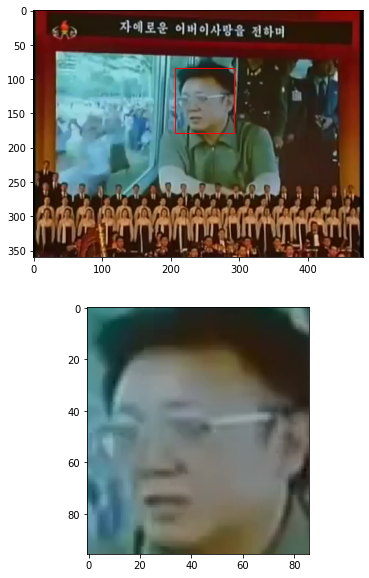

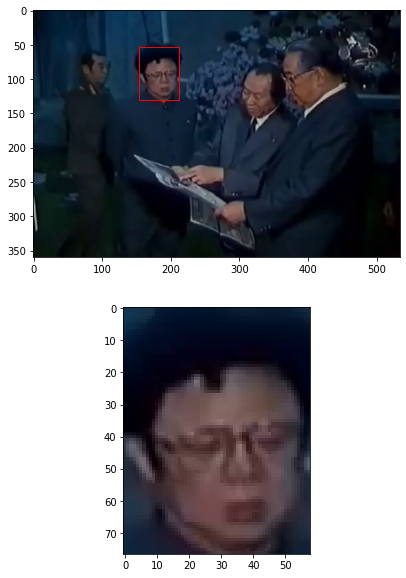

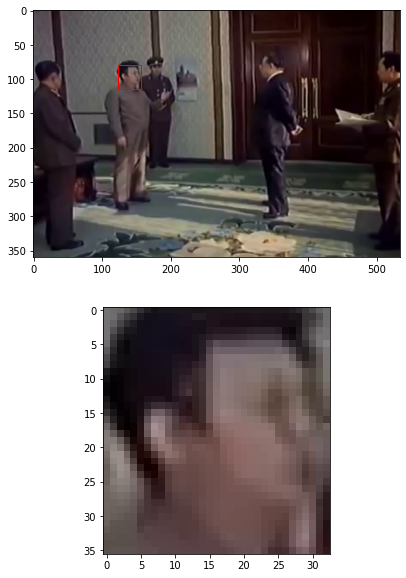

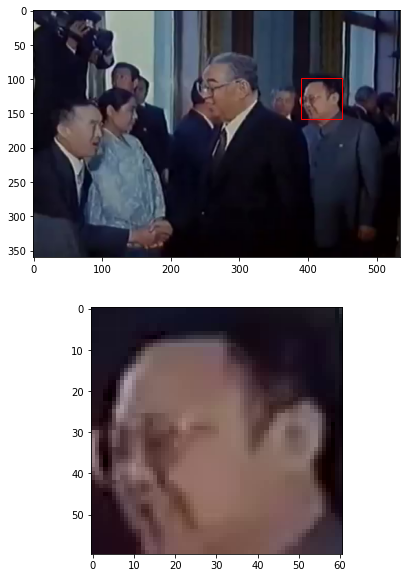

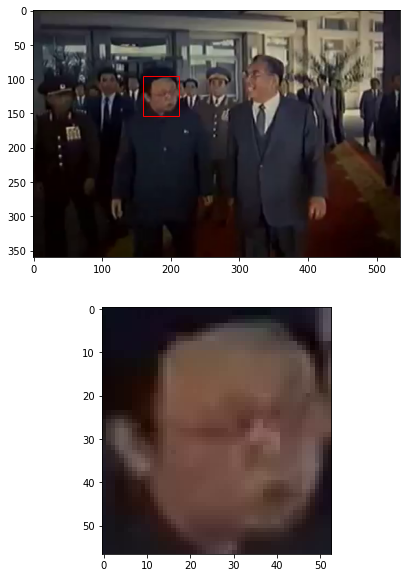

...

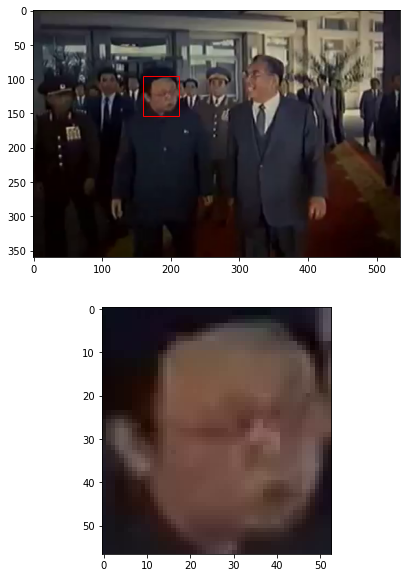

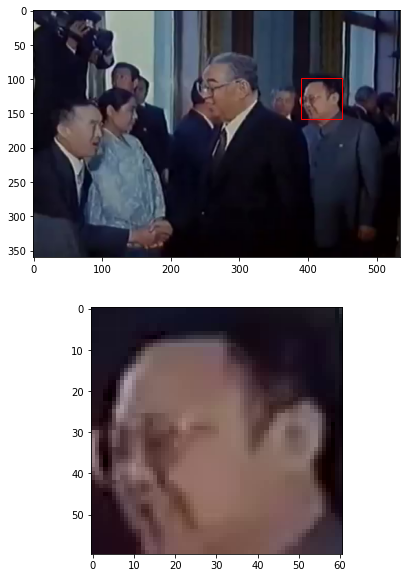

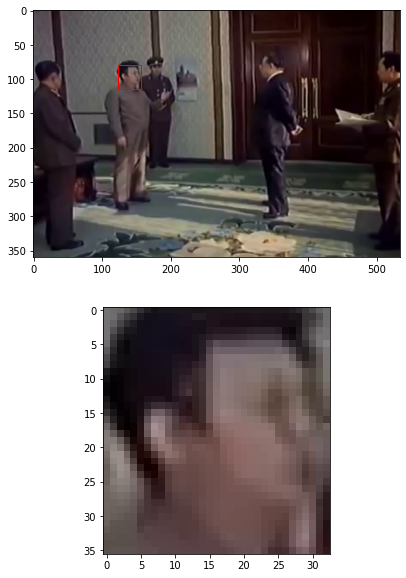

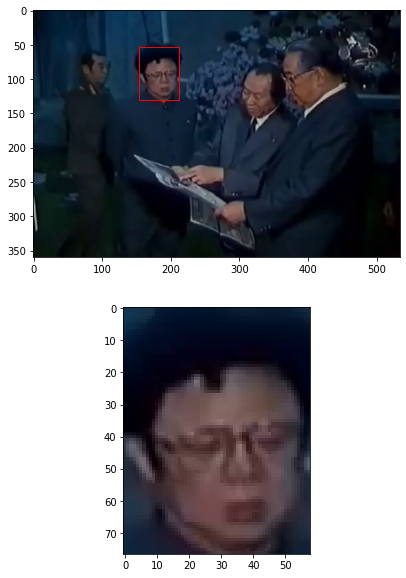

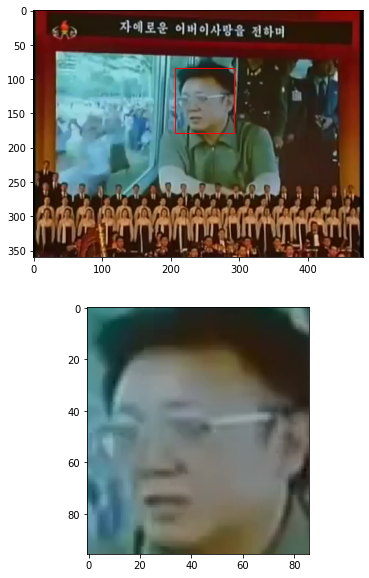

In [9]:
for i in range(len(files)):
    fig, ax = plt.subplots(2, figsize=(10, 10))
    img = cv2.imread("/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/"+files[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    rect = patches.Rectangle((face_x_list[i], face_y_list[i]), face_width_list[i], face_height_list[i], linewidth=1, edgecolor="r", facecolor="none")
    ax[0].add_patch(rect)
    ax[0].imshow(img)
    
    crop_img = img[face_y_list[i]:face_y_list[i]+face_height_list[i], face_x_list[i]:face_x_list[i]+face_width_list[i]]
    ax[1].imshow(crop_img)

In [14]:
Path("/raid/workspace/jbpark/IJB-C/Aligned/").mkdir(parents=True, exist_ok=True)

# Parse all the images

In [11]:
import tqdm

df = pd.read_csv("/raid/workspace/jbpark/IJBC/IJB/IJB-C/ijbc_subject_names.csv")
df2 = pd.concat([pd.read_csv("/raid/workspace/jbpark/IJBC/IJB/IJB-C/protocols/archive/ijbc_1N_gallery_G1.csv"),pd.read_csv("/raid/workspace/jbpark/IJBC/IJB/IJB-C/protocols/archive/ijbc_1N_gallery_G2.csv")])
subjects = df2.SUBJECT_ID.unique()

for person in tqdm.tqdm(subjects):
    df_temp = df2.loc[df2['SUBJECT_ID'] == person] 
    files = df_temp["FILENAME"].tolist()
    face_x_list = df_temp["FACE_X"].tolist()
    face_y_list = df_temp["FACE_Y"].tolist()
    face_width_list = df_temp["FACE_WIDTH"].tolist()
    face_height_list = df_temp["FACE_HEIGHT"].tolist()
    
    name = df[df["SUBJECT_ID"] == person]["SUBJECT_NAME"].values[0]
    #print("working with subject name: "+name)
    Path("/raid/workspace/jbpark/IJB-C/Aligned/"+name).mkdir(parents=True, exist_ok=True)
    
    for i in range(len(files)):
        img = cv2.imread("/raid/workspace/jbpark/IJBC/IJB/IJB-C/images/"+files[i])
        crop_img = img[face_y_list[i]:face_y_list[i]+face_height_list[i], face_x_list[i]:face_x_list[i]+face_width_list[i]]
        cv2.imwrite("/raid/workspace/jbpark/IJB-C/Aligned/"+name+"/"+files[i].split('/')[-1].split('.')[0].zfill(8)+'.jpg',crop_img)

100%|██████████| 3531/3531 [11:19<00:00,  5.20it/s]
